# Calibración de Cámara

In [32]:
# Importar librerías necesarias
import cv2
import numpy as np
import os
import glob
from PIL import Image as PILImage
import math
import matplotlib.pyplot as plt
from IPython.display import Image, display

# Configurar matplotlib para mejor visualización
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10


## 1. Configuración Inicial

Definimos los parámetros básicos para la calibración:


In [33]:
# Configuración del patrón de calibración
CHECKERBOARD = (9, 6)  # 9 esquinas de ancho, 6 de alto

# Criterios para refinamiento de esquinas
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Puntos del objeto 3D (coordenadas del mundo)
objp = np.zeros((CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1,2)

print(f"Patrón de calibración: {CHECKERBOARD[0]}x{CHECKERBOARD[1]} esquinas")


Patrón de calibración: 9x6 esquinas


## 2. Funciones de calibración reutilizables

Creamos funciones que nos permitirán realizar calibraciones de manera consistente:


In [34]:
def calibrar_camara(images_dir, checkerboard=(9,6), square_size=None, mostrar_proceso=True):
    """
    Realiza la calibración de cámara con las imágenes del directorio especificado.
    
    Args:
        images_dir (str): Directorio con las imágenes de calibración
        checkerboard (tuple): Dimensiones del patrón (ancho, alto)
        square_size (float): Tamaño del cuadrado del patrón en metros
        mostrar_proceso (bool): Si mostrar información detallada del proceso
    
    Returns:
        dict: Diccionario con los resultados de la calibración
    """
    
    # Configuración
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Crear puntos 3D
    objp = np.zeros((checkerboard[0] * checkerboard[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:checkerboard[0], 0:checkerboard[1]].T.reshape(-1,2)
    
    # Aplicar escala real si se proporciona
    if square_size is not None:
        objp = objp * square_size
    
    # Arrays para almacenar puntos
    objpoints = []  # Puntos 3D del mundo real
    imgpoints = []  # Puntos 2D en el plano de la imagen
    
    # Obtener lista de imágenes
    images = glob.glob(os.path.join(images_dir, '*.jpg'))
    if not images:
        raise ValueError(f"No se encontraron imágenes en '{images_dir}'")
    
    if mostrar_proceso:
        print(f"\n=== CALIBRACIÓN: {os.path.basename(images_dir)} ===")
        print(f"Encontradas {len(images)} imágenes")
    
    # PASO 1: Detectar esquinas en cada imagen
    imagenes_exitosas = 0
    for i, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Buscar esquinas del tablero
        ret, corners = cv2.findChessboardCorners(gray, checkerboard, None)
        
        if ret == True:
            objpoints.append(objp)
            # Refinar posición de esquinas
            corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
            imgpoints.append(corners2)
            imagenes_exitosas += 1
            
        else:
            if mostrar_proceso:
                print(f"No se detectaron esquinas en: {os.path.basename(fname)}")
    
    if mostrar_proceso:
        print(f"\nImágenes exitosas: {imagenes_exitosas}/{len(images)}")
    
    # Verificar que tenemos suficientes imágenes
    if len(objpoints) < 3:
        raise ValueError(f"Solo se detectaron esquinas en {len(objpoints)} imágenes. Se necesitan al menos 3.")
    
    # PASO 2: Calibración de la cámara
    if mostrar_proceso:
        print("\nRealizando calibración...")
    
    h, w = gray.shape
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (w, h), None, None)
    
    if not ret:
        raise ValueError("La calibración falló")
    
    # PASO 3: Calcular métricas de error
    diagonal = math.hypot(w, h)
    error_porcentual = (ret / diagonal) * 100
    
    # PASO 4: Preparar resultados
    resultados = {
        'error_rms': ret,
        'error_porcentual': error_porcentual,
        'tamaño_imagen': (w, h),
        'diagonal': diagonal,
        'matriz_camara': mtx,
        'coeficientes_distorsion': dist,
        'imagenes_exitosas': imagenes_exitosas,
        'total_imagenes': len(images),
        'objpoints': objpoints,
        'imgpoints': imgpoints,
        'rvecs': rvecs,
        'tvecs': tvecs
    }
    
    if mostrar_proceso:
        print(f"\n--- MÉTRICAS DE CALIBRACIÓN ---")
        print(f"Error RMS: {ret:.6f} píxeles")
        print(f"Tamaño imagen: {w}x{h}")
        if square_size is not None:
            print(f"\nTamaño del cuadrado del patrón: {square_size} metros")
        print(f"Error porcentual respecto a la diagonal: {error_porcentual:.5f}%")
        print(f"\n=== RESULTADOS DETALLADOS - {os.path.basename(images_dir)} ===")
        print(f"Matriz de la cámara (K):")
        print(resultados['matriz_camara'])
        print(f"\nCoeficientes de distorsión:")
        print(resultados['coeficientes_distorsion'])
        if square_size is not None:         
            print("\nVectores de rotación (rvecs):")
            for i, rvec in enumerate(resultados['rvecs']):
                print(f"Imagen {i+1}: {rvec.ravel()}")
            print("\nVectores de traslación (tvecs):")
            for i, tvec in enumerate(resultados['tvecs']):
                print(f"Imagen {i+1}: {tvec.ravel()}")

        print(f"\nTasa de éxito: {resultados['imagenes_exitosas']}/{resultados['total_imagenes']} ({resultados['imagenes_exitosas']/resultados['total_imagenes']*100:.1f}%)")

            
    return resultados


In [35]:
# Análisis de detección de esquinas
def deteccion_esquinas(images_dir, mostrar_imagenes=True):
    """
    Analiza la detección de esquinas en las imágenes del directorio.
    """
    images = glob.glob(os.path.join(images_dir, '*.jpg'))
    
    exitosas = []
    fallidas = []
    
    print(f"\n=== ANÁLISIS DE DETECCIÓN DE ESQUINAS ===")
    print(f"Directorio: {os.path.basename(images_dir)}")
    print(f"Total de imágenes: {len(images)}")
    
    for i, fname in enumerate(images[:5]):  # Analizar solo las primeras 5
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)
        
        if ret:
            exitosas.append(fname)
            print(f"{os.path.basename(fname)}: Esquinas detectadas")
            
            if mostrar_imagenes and i < 5:  # Mostrar las primeras 4 exitosas
                # Refinar esquinas
                corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
                
                # Dibujar esquinas
                img_con_esquinas = img.copy()
                cv2.drawChessboardCorners(img_con_esquinas, CHECKERBOARD, corners2, ret)
                
                # Mostrar imagen
                plt.figure(figsize=(10, 6))
                plt.subplot(1, 2, 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                plt.title(f'Original: {os.path.basename(fname)}')
                plt.axis('off')
                
                plt.subplot(1, 2, 2)
                plt.imshow(cv2.cvtColor(img_con_esquinas, cv2.COLOR_BGR2RGB))
                plt.title('Esquinas Detectadas')
                plt.axis('off')
                
                plt.tight_layout()
                plt.show()
        else:
            fallidas.append(fname)
            print(f"✗ {os.path.basename(fname)}: No se detectaron esquinas")
    
    # Resumen
    print(f"\nResumen (primeras 5 imágenes):")
    print(f"- Exitosas: {len(exitosas)}")
    print(f"- Fallidas: {len(fallidas)}")
    
    return exitosas, fallidas


In [36]:
def mostrar_correccion_distorsion(images_dir, resultados, num_imagenes=4, mostrar_gif=False):
    """
    Muestra la corrección de distorsión en algunas imágenes y genera un GIF comparativo solo para la primera imagen.

    Parámetros:
        images_dir (str): Directorio con imágenes.
        resultados (dict): Resultados de la calibración (matriz de cámara y coeficientes).
        num_imagenes (int): Cantidad de imágenes a mostrar.
        mostrar_gif (bool): Si es True, genera y muestra un GIF comparando original y corregida solo para la primera imagen.
    """
    images = glob.glob(os.path.join(images_dir, '*.jpg'))
    if not images:
        print(" No se encontraron imágenes en el directorio.")
        return

    # Guardar referencia a la primera imagen para el GIF
    primera_original = None
    primera_corregida = None

    # Mostrar comparaciones
    for i in range(min(num_imagenes, len(images))):
        img_original = cv2.imread(images[i])
        h, w = img_original.shape[:2]

        # Obtener matriz de cámara óptima
        newcameramtx, _ = cv2.getOptimalNewCameraMatrix(
            resultados['matriz_camara'],
            resultados['coeficientes_distorsion'],
            (w, h), 1, (w, h)
        )

        # Corregir distorsión
        img_corregida = cv2.undistort(
            img_original,
            resultados['matriz_camara'],
            resultados['coeficientes_distorsion'],
            None,
            newcameramtx
        )

        # Añadir texto
        cv2.putText(img_original, 'Original', (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 255), 3)
        cv2.putText(img_corregida, 'Corregida', (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)

        # Mostrar comparación
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
        plt.title(f'Original - {os.path.basename(images[i])}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(img_corregida, cv2.COLOR_BGR2RGB))
        plt.title('Corregida (sin distorsión)')
        plt.axis('off')

        plt.suptitle(f'Corrección de Distorsión - {os.path.basename(images_dir)}', fontsize=14)
        plt.tight_layout()
        plt.show()

        # Guardar la primera imagen para el GIF
        if i == 0:
            primera_original = img_original
            primera_corregida = img_corregida

    # Crear y mostrar GIF después del bucle
    if mostrar_gif and primera_original is not None:
        # Define un ancho máximo para el GIF
        max_ancho = 1280 
        h, w = primera_original.shape[:2]
        escala = max_ancho / w
        
        img_orig_resized = primera_original
        img_corr_resized = primera_corregida

        # Solo redimensionamos si la imagen es MÁS grande que max_ancho
        if escala < 1:
            dim = (max_ancho, int(h * escala))
            img_orig_resized = cv2.resize(primera_original, dim, interpolation=cv2.INTER_AREA)
            img_corr_resized = cv2.resize(primera_corregida, dim, interpolation=cv2.INTER_AREA)

        # Creamos una lista solo con los dos frames redimensionados
        frames_bgr = [img_orig_resized, img_corr_resized]
        
        # Convertimos a RGB para PIL
        frames_rgb = [cv2.cvtColor(f, cv2.COLOR_BGR2RGB) for f in frames_bgr]
        
        # Convertimos a formato PIL Image
        frames_pil = [PILImage.fromarray(f) for f in frames_rgb]

        gif_path = os.path.join(images_dir, "comparacion_distorsion.gif")

        frames_pil[0].save(
            gif_path,
            save_all=True,
            append_images=frames_pil[1:], # Añade solo el segundo frame
            duration=500,                 # Duración
            loop=0,                       # loop=0 hace que se repita
            optimize=True                 # Compresión 
        )

        # Mostrar GIF con IPython.display
        print("\n GIF comparativo (primera imagen):")
        display(Image(filename=gif_path))


## 3. Análisis Paso a Paso - Imágenes de Baja Calidad (images3/)

Comenzamos con las imágenes de `images3/` que fueron tomadas al patrón de calibración impreso en una hoja de papel:


In [37]:
# Verificar que el directorio existe
if os.path.exists('./images3'):
    print("Directorio images3/ encontrado")
    imagenes = glob.glob('./images3/*.jpg')
    print(f"- {len(imagenes)} imágenes encontradas")
    
    # Mostrar información de la primera imagen
    if imagenes:
        img_ejemplo = cv2.imread(imagenes[0])
        h, w = img_ejemplo.shape[:2]
        print(f"- Tamaño de imagen: {w}x{h}")
else:
    print("✗ Directorio images3/ no encontrado")


Directorio images3/ encontrado
- 23 imágenes encontradas
- Tamaño de imagen: 4624x3472


### 3.1 Detección de Esquinas


=== ANÁLISIS DE DETECCIÓN DE ESQUINAS ===
Directorio: images3
Total de imágenes: 23
IMG_20251005_180045.jpg: Esquinas detectadas


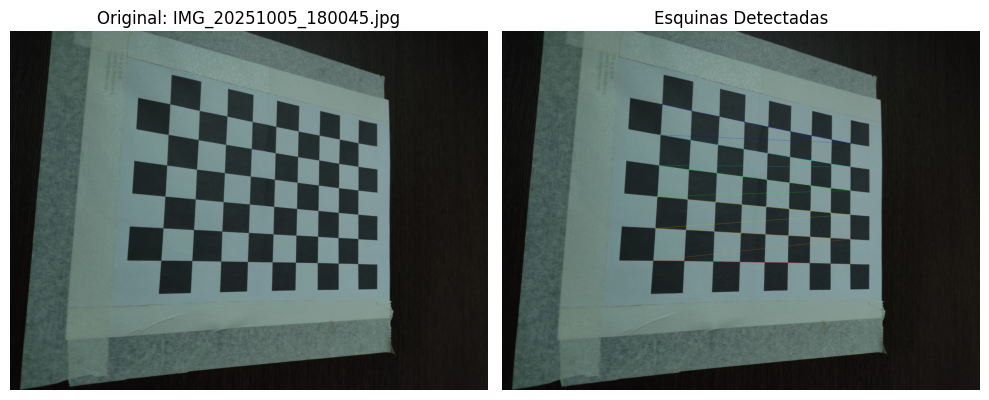

IMG_20251005_180051.jpg: Esquinas detectadas


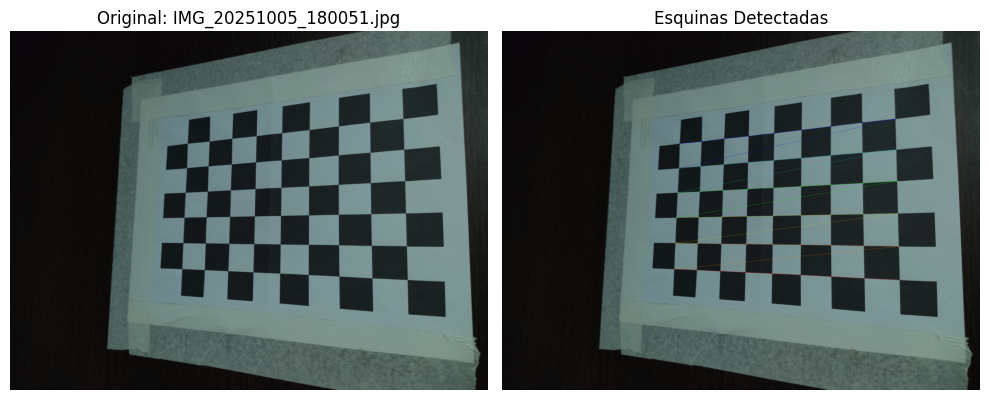

IMG_20251005_180055.jpg: Esquinas detectadas


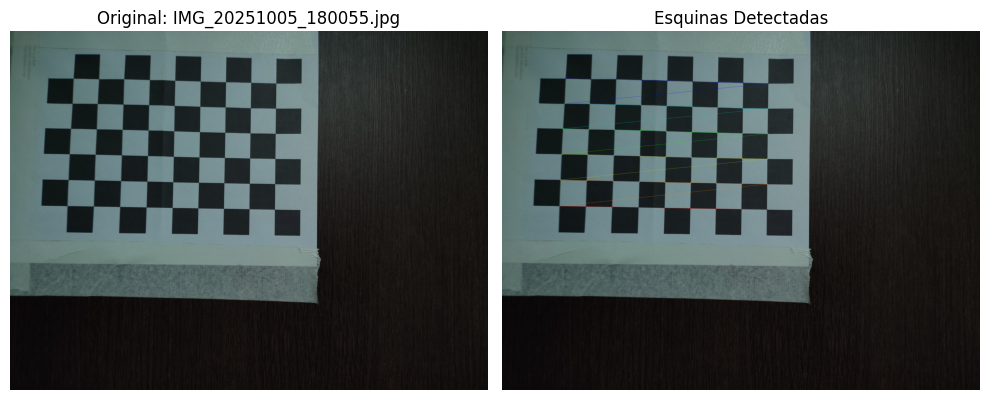

IMG_20251005_180100.jpg: Esquinas detectadas


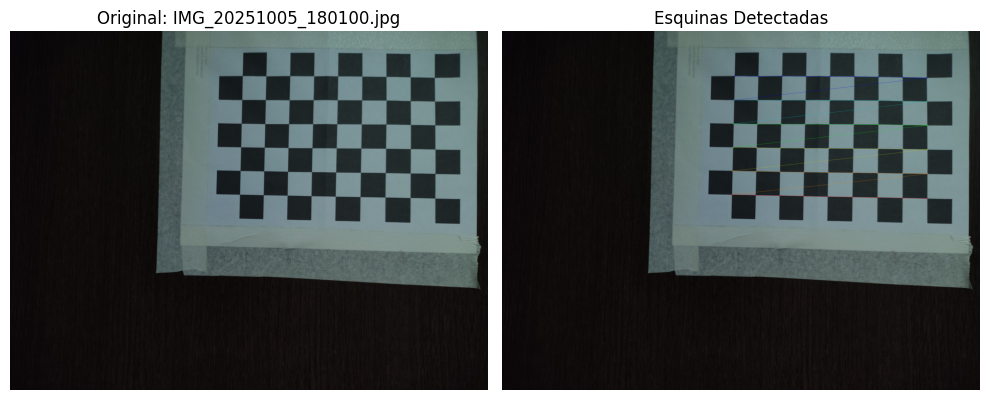

IMG_20251005_180104.jpg: Esquinas detectadas


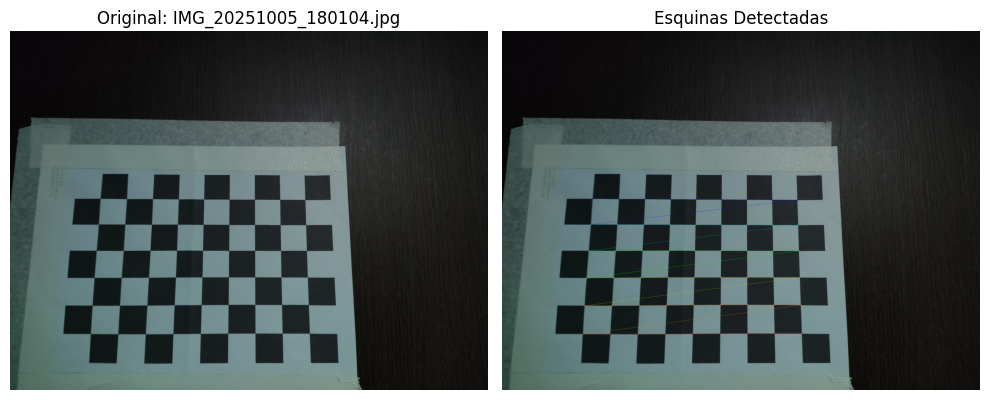


Resumen (primeras 5 imágenes):
- Exitosas: 5
- Fallidas: 0


In [38]:
# Analizar imágenes de images3/
exitosas_3, fallidas_3 = deteccion_esquinas('./images3')

En estas imágenes es complejo distinguir la detección de esquinas debido a la alta resolución de la imagen, sin embargo al hacer zoom se puede observar que las esquinas son detectadas correctamente.

### 3.2 Calibración con images3/


In [39]:
# Realizar calibración con images3/
resultados_3 = calibrar_camara('./images3', square_size=0.018, mostrar_proceso=True)


=== CALIBRACIÓN: images3 ===
Encontradas 23 imágenes

Imágenes exitosas: 23/23

Realizando calibración...

--- MÉTRICAS DE CALIBRACIÓN ---
Error RMS: 1.343309 píxeles
Tamaño imagen: 4624x3472

Tamaño del cuadrado del patrón: 0.018 metros
Error porcentual respecto a la diagonal: 0.02323%

=== RESULTADOS DETALLADOS - images3 ===
Matriz de la cámara (K):
[[3.44058029e+03 0.00000000e+00 2.29176327e+03]
 [0.00000000e+00 3.46542527e+03 1.73287511e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Coeficientes de distorsión:
[[ 0.09842162 -0.14360298 -0.00122039  0.00043286 -0.16591799]]

Vectores de rotación (rvecs):
Imagen 1: [ 0.6887973  -0.1463835  -3.00294703]
Imagen 2: [-0.62463457 -0.19449776 -3.0722848 ]
Imagen 3: [ 0.03581403 -0.09770413 -3.12454768]
Imagen 4: [-0.06526614 -0.06489522 -3.11723698]
Imagen 5: [ 0.03198167 -0.2898072  -3.12594385]
Imagen 6: [-0.16857847 -0.33548371 -3.11055215]
Imagen 7: [-0.05687714  0.07241527 -3.12076971]
Imagen 8: [-0.03560163 -0.39466649 -3.10

### 3.3 Visualización de la Corrección de Distorsión


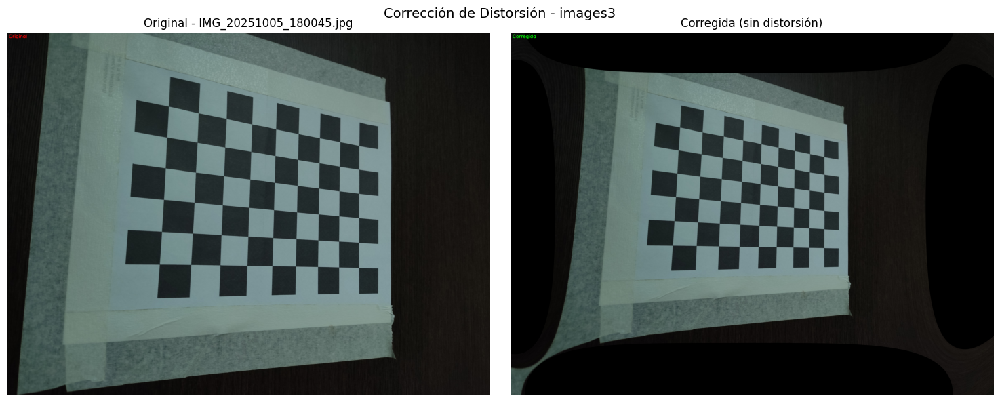

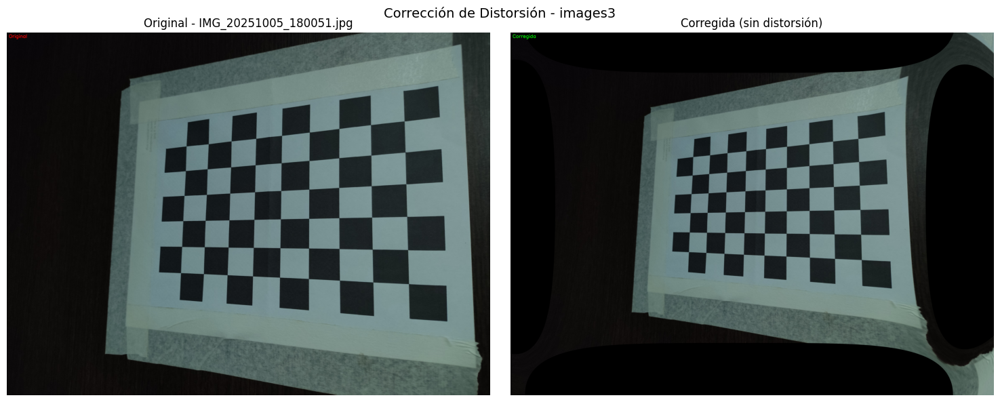

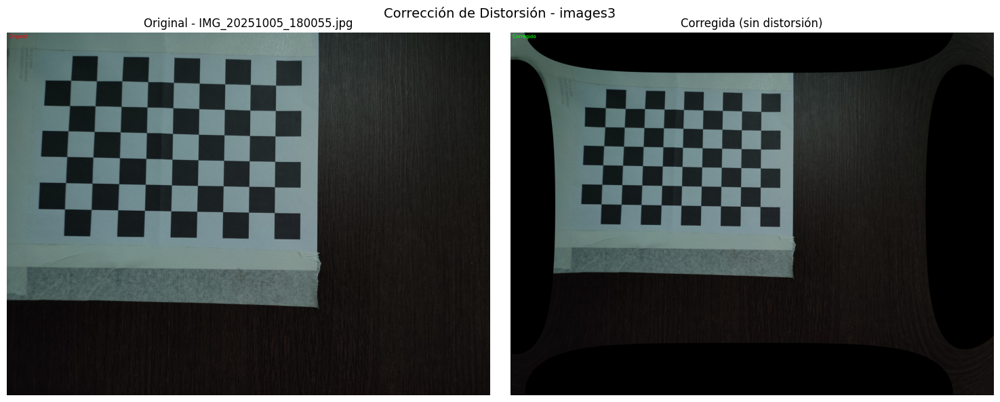

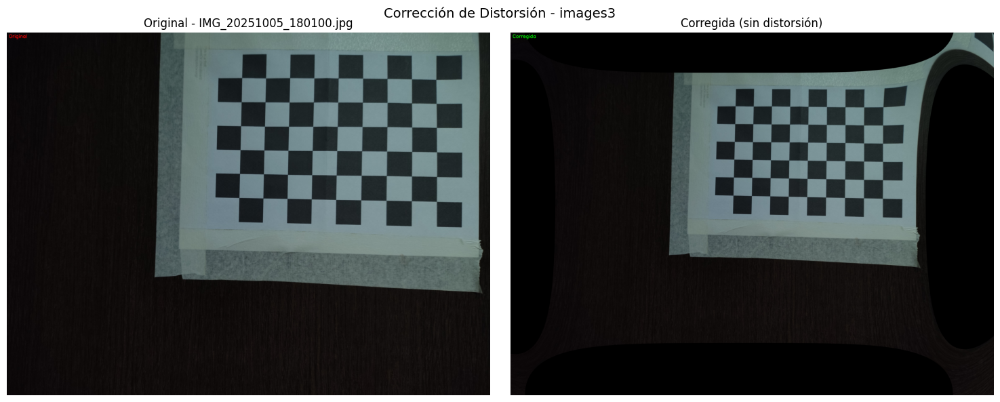


 GIF comparativo (primera imagen):


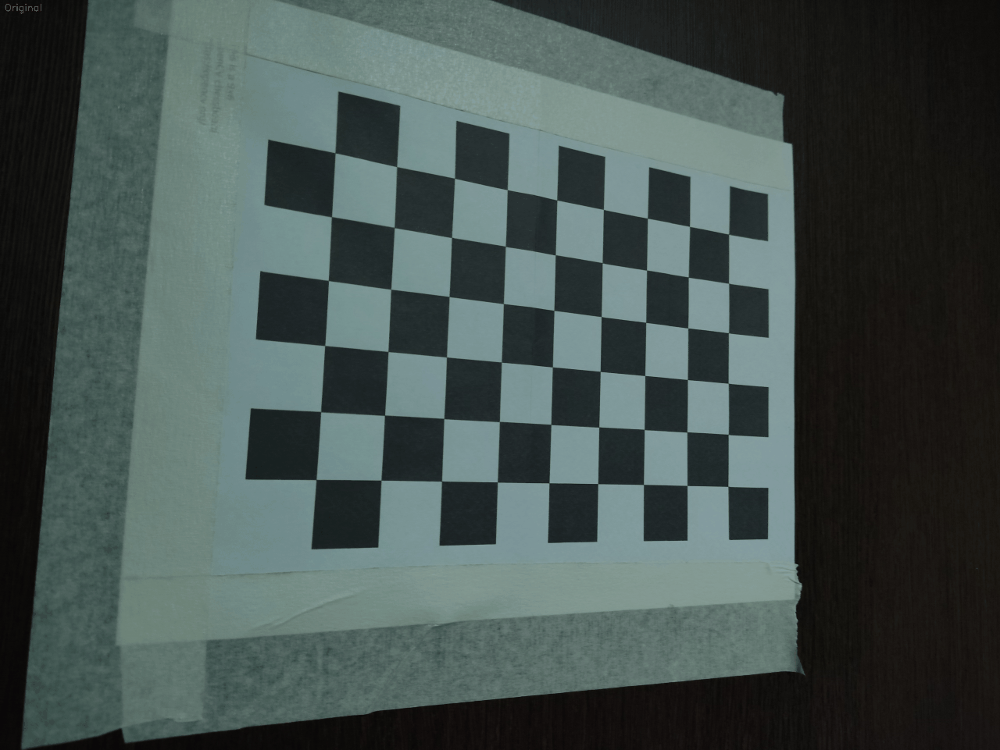

In [40]:
# Mostrar corrección para images3/
mostrar_correccion_distorsion('./images3', resultados_3, 4, True)

A pesar de tener unas métricas aceptables el resultado de la corrección de distorsión no es bueno. Parece que hay un sobreajuste de la distorsión y la causa puede ser la calidad de las fotos usadas para la calibración, especialmente la iluminación.

## 4. Comparación con Imágenes de Mejor Calidad (images/)

Ahora repetimos el proceso con las imágenes de `images/` que fueron tomadas a una pantalla para eliminar el efecto de la iluminación en la calibración.

 Directorio images/ encontrado
- 24 imágenes encontradas
- Tamaño de imagen: 4624x3472
- Ejemplo: IMG_20251003_092740.jpg

=== ANÁLISIS DE DETECCIÓN DE ESQUINAS ===
Directorio: images
Total de imágenes: 24
IMG_20251003_092740.jpg: Esquinas detectadas


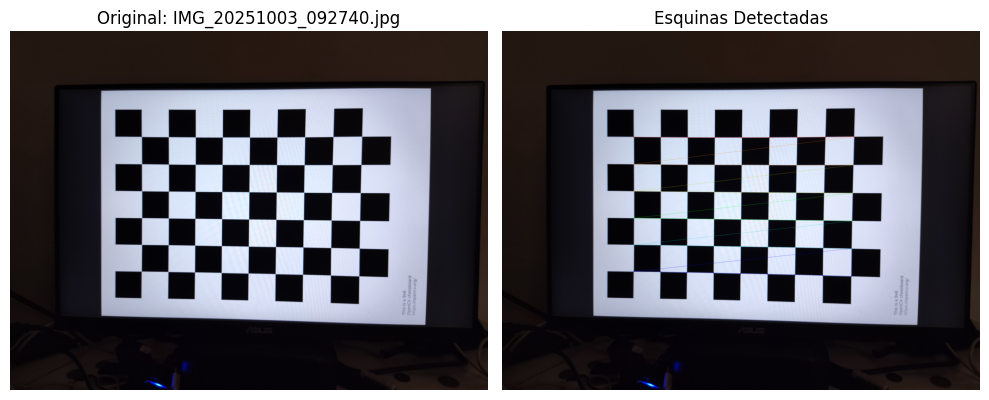

IMG_20251003_092745.jpg: Esquinas detectadas


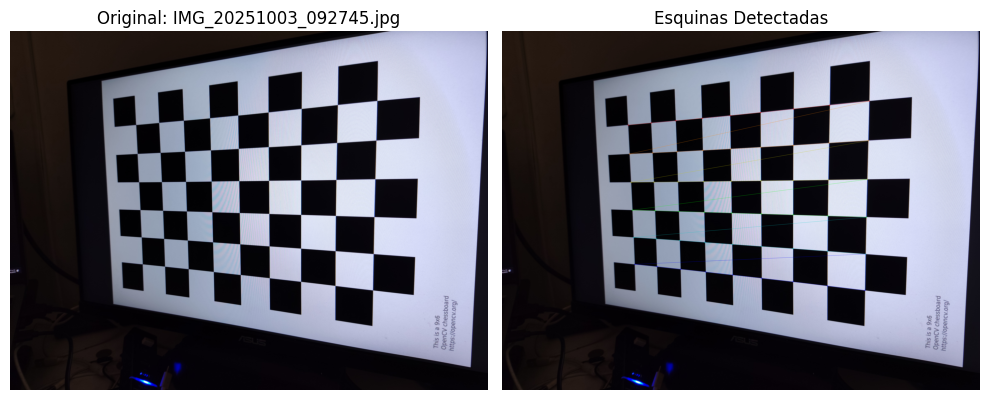

IMG_20251003_092753.jpg: Esquinas detectadas


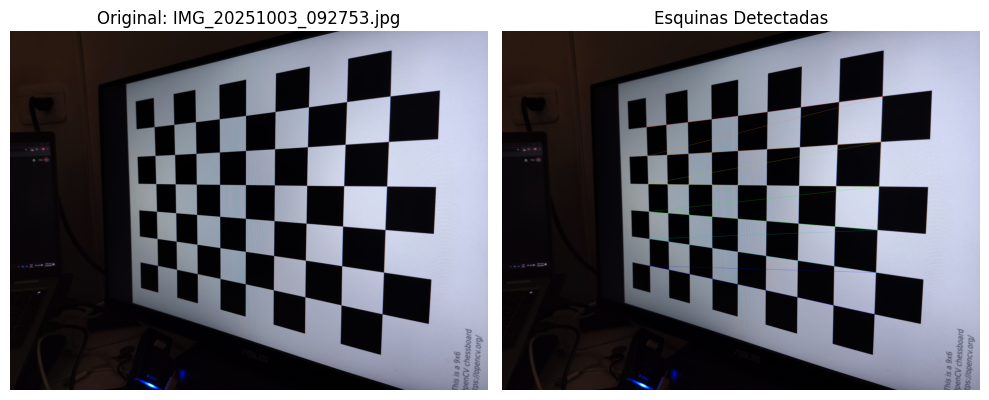

IMG_20251003_092758.jpg: Esquinas detectadas


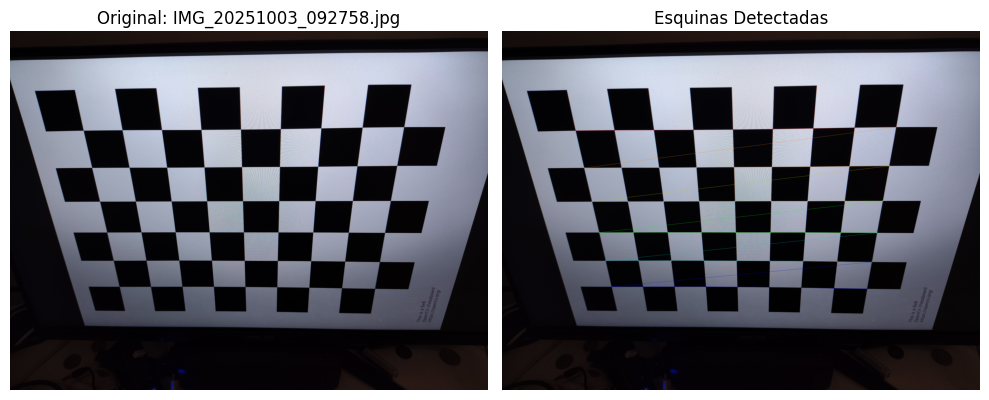

IMG_20251003_092803.jpg: Esquinas detectadas


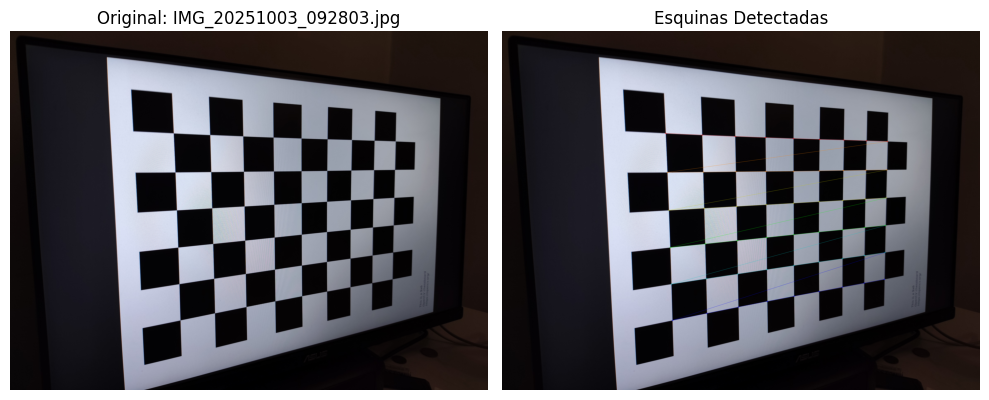


Resumen (primeras 5 imágenes):
- Exitosas: 5
- Fallidas: 0

=== CALIBRACIÓN: images ===
Encontradas 24 imágenes

Imágenes exitosas: 24/24

Realizando calibración...

--- MÉTRICAS DE CALIBRACIÓN ---
Error RMS: 1.230608 píxeles
Tamaño imagen: 4624x3472

Tamaño del cuadrado del patrón: 0.035 metros
Error porcentual respecto a la diagonal: 0.02128%

=== RESULTADOS DETALLADOS - images ===
Matriz de la cámara (K):
[[3.46110438e+03 0.00000000e+00 2.29275861e+03]
 [0.00000000e+00 3.45999706e+03 1.76017055e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Coeficientes de distorsión:
[[ 1.35954635e-01 -3.46082460e-01 -2.21648396e-04 -1.47471865e-04
   1.91108903e-01]]

Vectores de rotación (rvecs):
Imagen 1: [0.02758808 0.06099311 0.01096038]
Imagen 2: [0.09673557 0.44063457 0.00649133]
Imagen 3: [0.08708542 0.63061438 0.03032241]
Imagen 4: [ 0.4792206   0.04197719 -0.01131994]
Imagen 5: [ 0.09201915 -0.45958694 -0.04026249]
Imagen 6: [-0.49789071 -0.01957225  0.02274388]
Imagen 7: [ 0.127

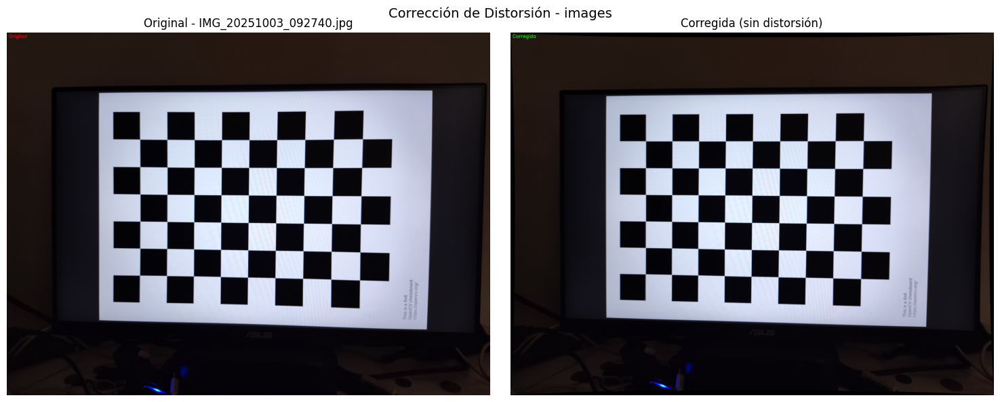

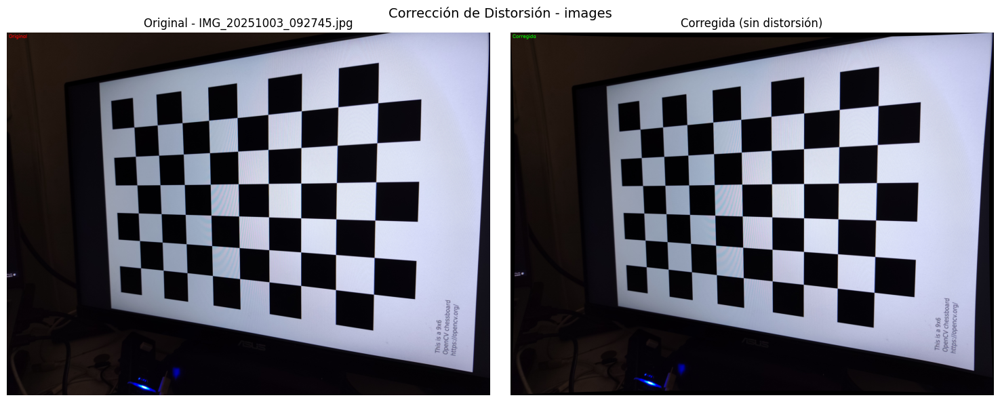

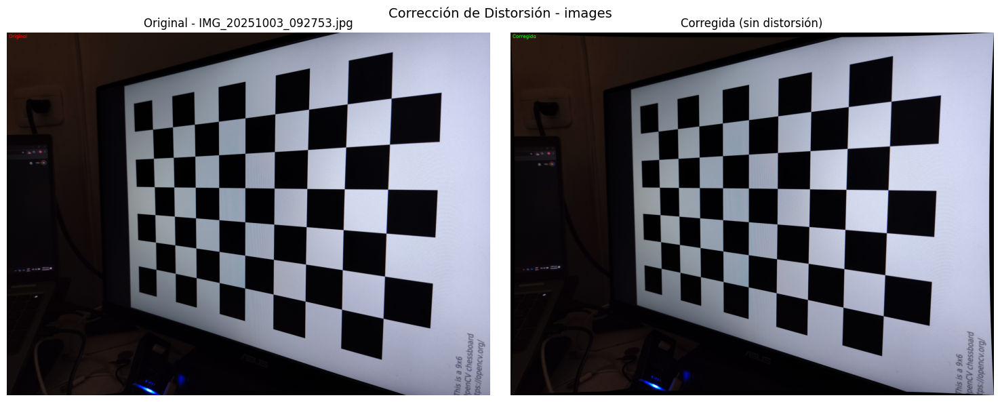

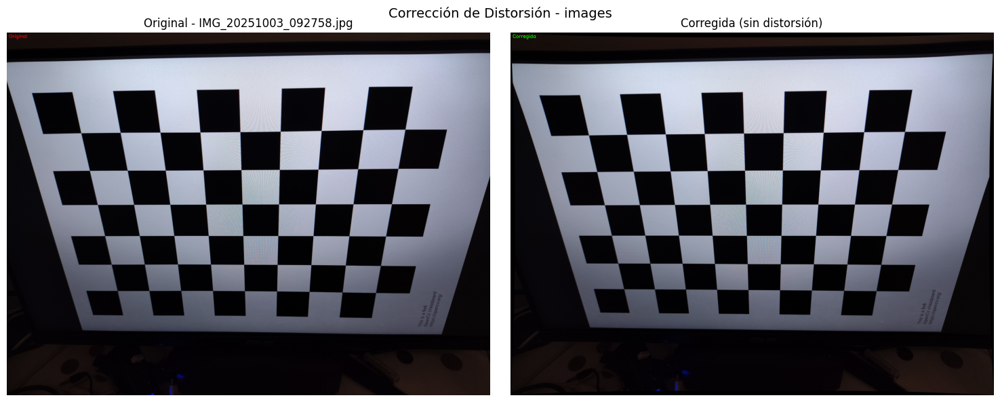


 GIF comparativo (primera imagen):


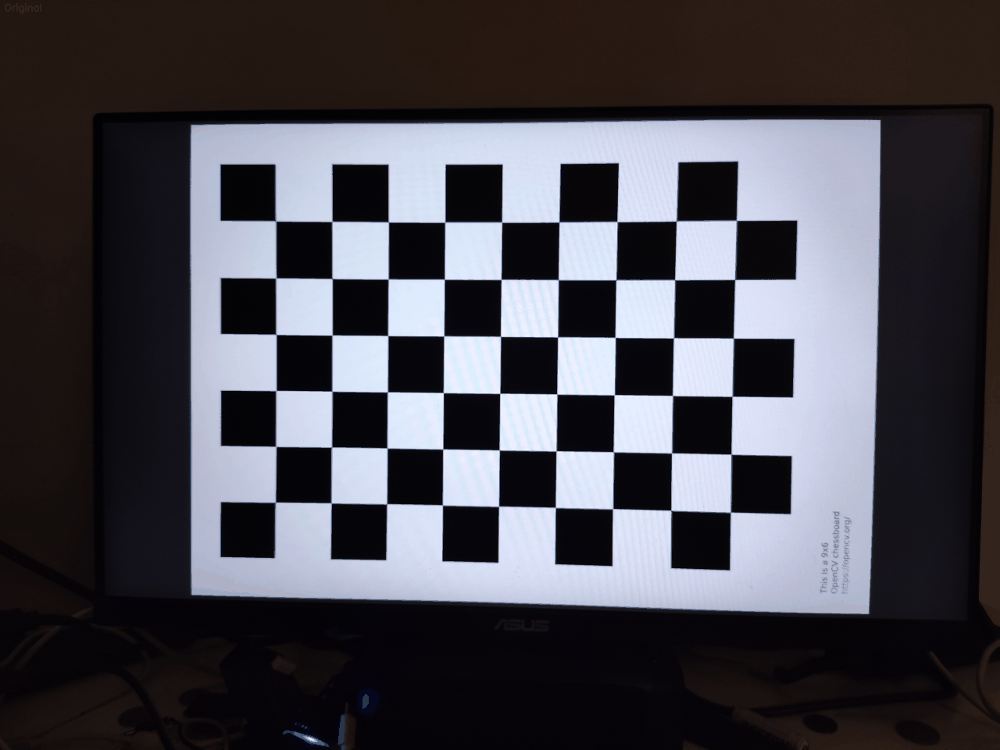

In [41]:
# Verificar directorio images/
if os.path.exists('./images'):
    print(" Directorio images/ encontrado")
    imagenes = glob.glob('./images/*.jpg')
    print(f"- {len(imagenes)} imágenes encontradas")
    
    if imagenes:
        img_ejemplo = cv2.imread(imagenes[0])
        h, w = img_ejemplo.shape[:2]
        print(f"- Tamaño de imagen: {w}x{h}")
        print(f"- Ejemplo: {os.path.basename(imagenes[0])}")
else:
    print(" Directorio images/ no encontrado")

# Análisis de detección de esquinas en images/
exitosas_images, fallidas_images = deteccion_esquinas('./images')

# Calibración con images/
resultados_images = calibrar_camara('./images', square_size=0.035, mostrar_proceso=True)

# Mostrar corrección de distorsión para images/
mostrar_correccion_distorsion('./images', resultados_images, 4, True)


## 5. Aplicación de la corrección de distorsión en otras imágenes



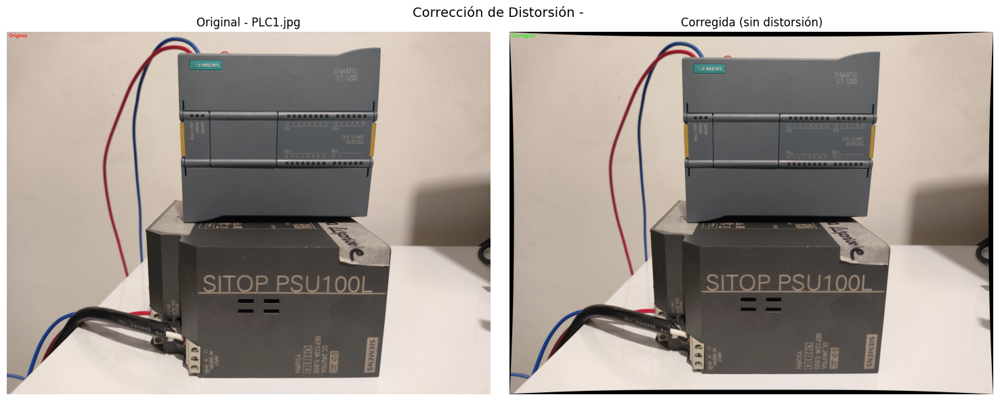

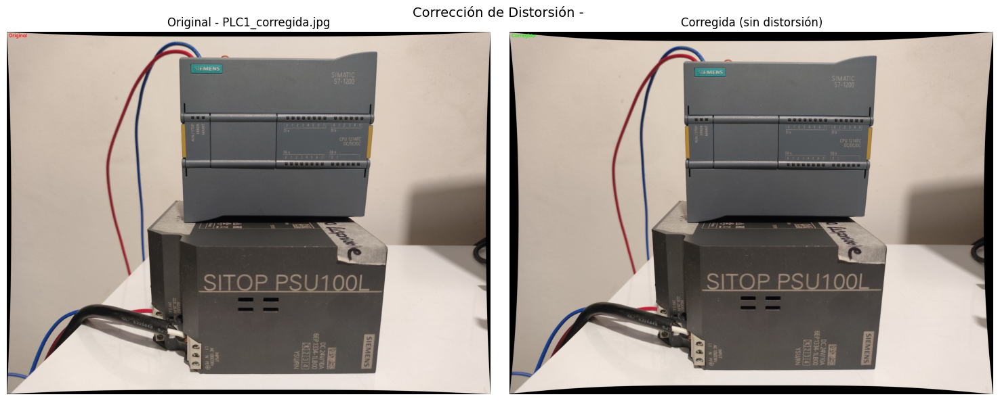


 GIF comparativo (primera imagen):


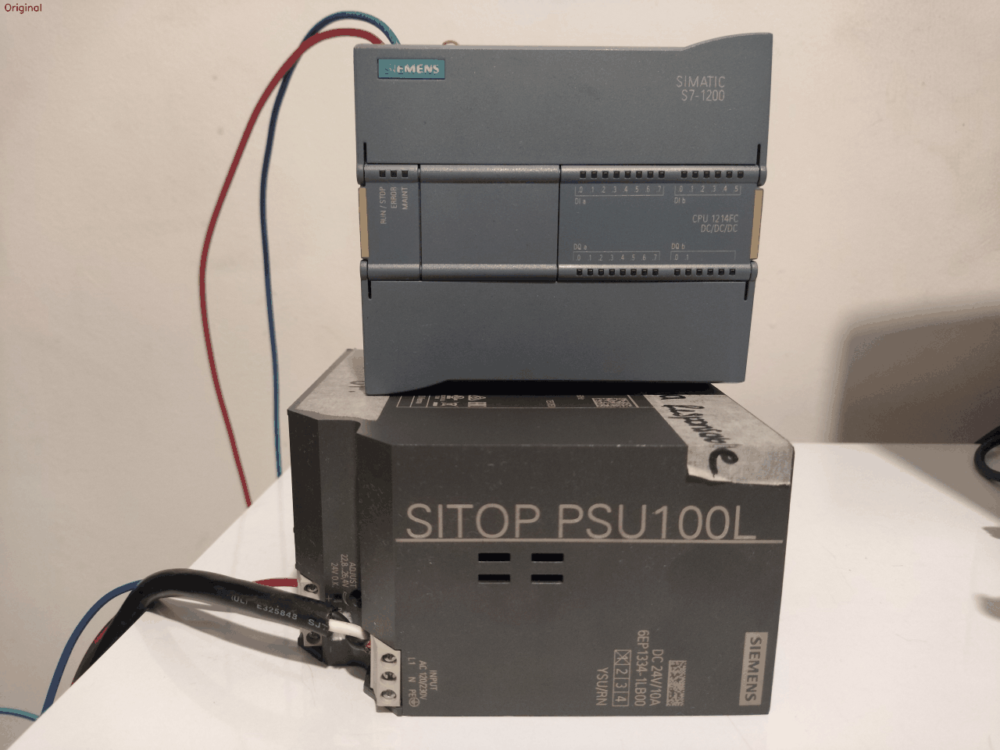

In [42]:
mostrar_correccion_distorsion('./imgs_to_correct/', resultados_images, 2, True)

## 6. Demostración del Problema del Error Absoluto en Píxeles

A continuación, se demostrará por qué el error absoluto en píxeles, usado en la guía como indicador de éxito en la calibración, puede resultar engañoso al comparar resultados entre imágenes de distintas resoluciones. En su lugar, un error relativo se propone como una métrica más justa y representativa.

Para ilustrarlo, se utilizarán dos conjuntos de imágenes:

- La carpeta `images_opencv/`, correspondiente a las imágenes empleadas en la guía de OpenCV, con una resolución de 640×480 px.

- La carpeta `images_resized_1438x1080/`, que contiene las mismas imágenes redimensionadas desde la carpeta `images/` a una resolución de 1438×1080 px.


Verificando directorios de diferentes resoluciones:
images_opencv: 41 imágenes, tamaño 640x480
images_resized_1438x1080: 24 imágenes, tamaño 1438x1080

--- Calibrando images_opencv ---

=== CALIBRACIÓN: images_opencv ===
Encontradas 41 imágenes

Imágenes exitosas: 41/41

Realizando calibración...

--- MÉTRICAS DE CALIBRACIÓN ---
Error RMS: 0.260320 píxeles
Tamaño imagen: 640x480
Error porcentual respecto a la diagonal: 0.03254%

=== RESULTADOS DETALLADOS - images_opencv ===
Matriz de la cámara (K):
[[503.51179012   0.         313.41350141]
 [  0.         503.14610486 243.09110798]
 [  0.           0.           1.        ]]

Coeficientes de distorsión:
[[ 2.11014320e-01 -4.84232133e-01  3.54626678e-04 -2.22615795e-03
   2.58120491e-01]]

Tasa de éxito: 41/41 (100.0%)


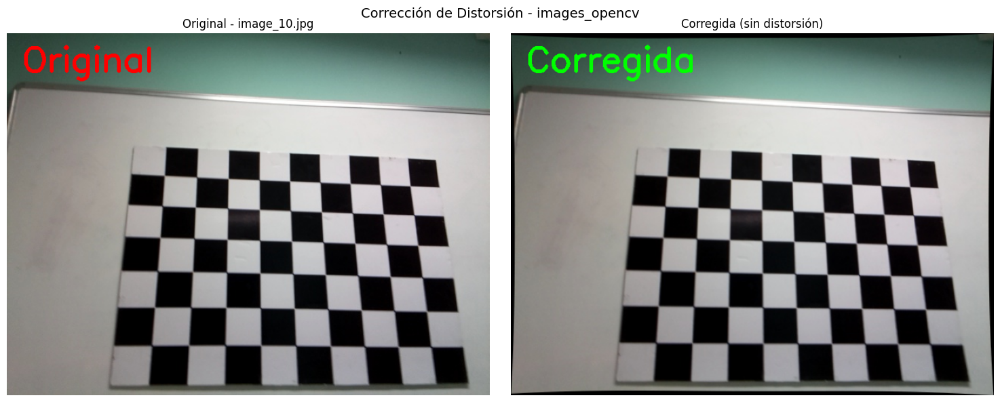

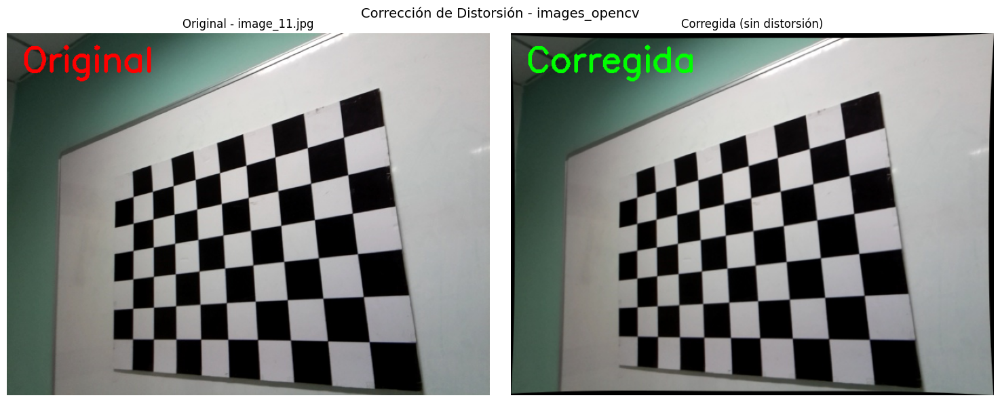

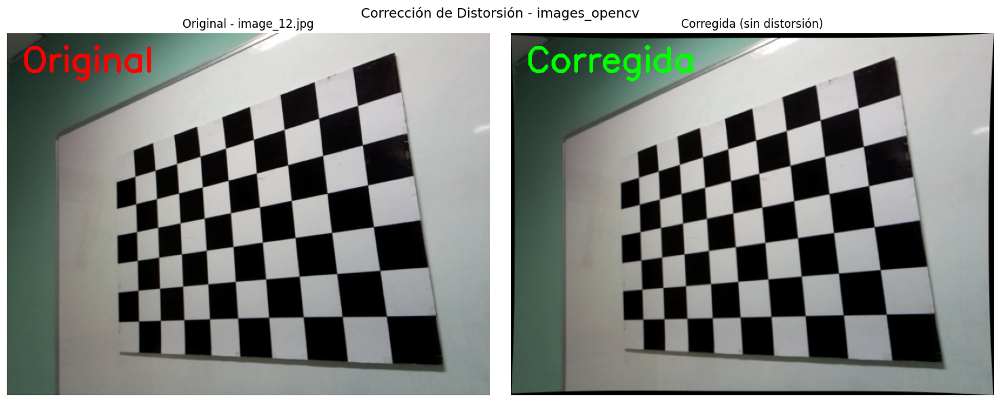


--- Calibrando images_resized_1438x1080 ---

=== CALIBRACIÓN: images_resized_1438x1080 ===
Encontradas 24 imágenes

Imágenes exitosas: 24/24

Realizando calibración...

--- MÉTRICAS DE CALIBRACIÓN ---
Error RMS: 0.329176 píxeles
Tamaño imagen: 1438x1080
Error porcentual respecto a la diagonal: 0.01830%

=== RESULTADOS DETALLADOS - images_resized_1438x1080 ===
Matriz de la cámara (K):
[[1.07704548e+03 0.00000000e+00 7.12440132e+02]
 [0.00000000e+00 1.07698366e+03 5.47321392e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Coeficientes de distorsión:
[[ 1.45083455e-01 -3.91320747e-01 -1.95914472e-04 -2.89563761e-04
   2.44412368e-01]]

Tasa de éxito: 24/24 (100.0%)


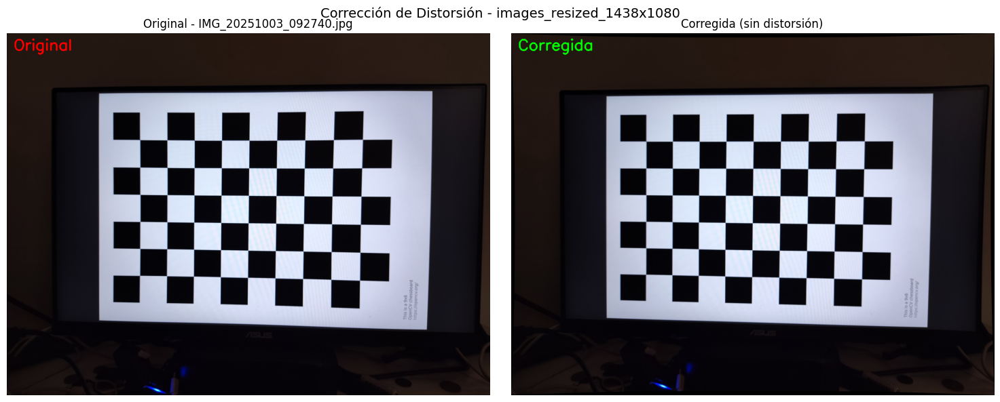

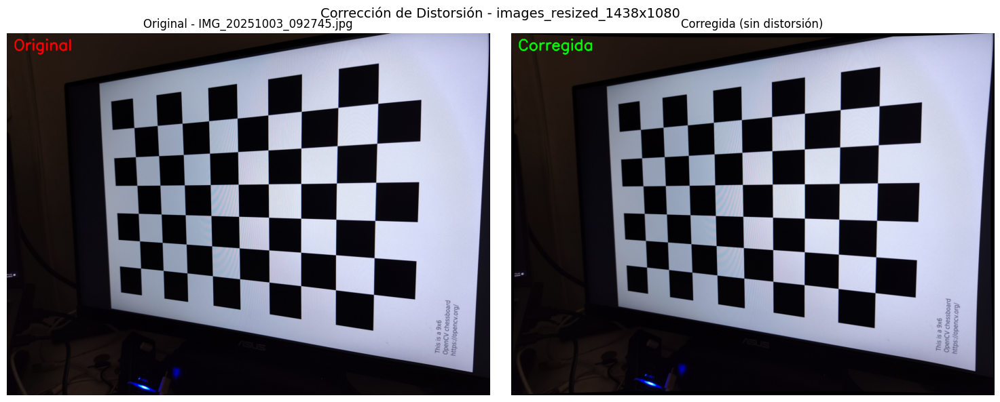

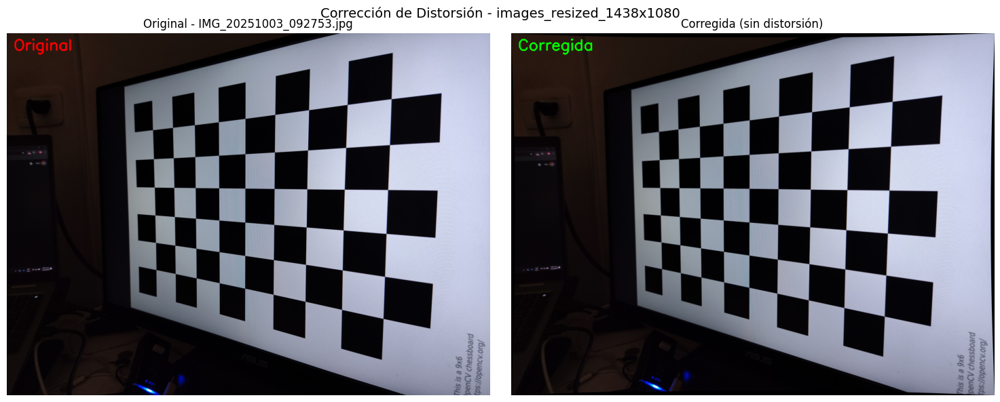

In [43]:
# Verificar directorios de diferentes resoluciones
directorios_resolucion = {
    'images_opencv': './images_opencv',
    'images_resized_1438x1080': './images_resized_1438x1080'
}

print("Verificando directorios de diferentes resoluciones:")
for nombre, directorio in directorios_resolucion.items():
    if os.path.exists(directorio):
        imagenes = glob.glob(os.path.join(directorio, '*.jpg'))
        if imagenes:
            img_ejemplo = cv2.imread(imagenes[0])
            h, w = img_ejemplo.shape[:2]
            print(f"{nombre}: {len(imagenes)} imágenes, tamaño {w}x{h}")
        else:
            print(f"{nombre}: No hay imágenes")
    else:
        print(f"{nombre}: Directorio no encontrado")

# Realizar calibraciones con diferentes resoluciones
resultados_resoluciones = {}

for nombre, directorio in directorios_resolucion.items():
    if os.path.exists(directorio):
        try:
            print(f"\n--- Calibrando {nombre} ---")
            resultados = calibrar_camara(directorio, mostrar_proceso=True)
            resultados_resoluciones[nombre] = resultados
            mostrar_correccion_distorsion(directorio, resultados, 3, False)

        except Exception as e:
            print(f"Error en {nombre}: {e}")
    else:
        print(f"Saltando {nombre}: directorio no encontrado")


## 7. Resumen y Conclusiones

### 7.1 Resumen de todas las calibraciones


In [44]:
# Crear resumen final de todas las calibraciones
def resumen_final(resultados_dict):
    """
    Crea un resumen final de todas las calibraciones realizadas.
    """
    print(f"\n{'='*80}")
    print(f"RESUMEN FINAL - TODAS LAS CALIBRACIONES")
    print(f"{'='*80}")
    
    # Preparar datos
    datos = []
    for nombre, resultados in resultados_dict.items():
        w, h = resultados['tamaño_imagen']
        datos.append({
            'nombre': nombre,
            'resolucion': f"{w}x{h}",
            'error_rms': resultados['error_rms'],
            'error_porcentual': resultados['error_porcentual'],
            'exitosas': resultados['imagenes_exitosas'],
            'total': resultados['total_imagenes'],
            'tasa_exito': resultados['imagenes_exitosas']/resultados['total_imagenes']*100
        })
    
    # Ordenar por error porcentual 
    datos.sort(key=lambda x: x['error_porcentual'])
    
    # Mostrar tabla
    print(f"{'Directorio':30} | {'Resolución':12} | {'Error RMS':10} | {'Error %':8} | {'Éxito':8}")
    print(f"{'-'*30} | {'-'*12} | {'-'*10} | {'-'*8} | {'-'*8}")
    
    for dato in datos:
        print(f"{dato['nombre']:30} | {dato['resolucion']:12} | {dato['error_rms']:10.4f} | {dato['error_porcentual']:8.4f} | {dato['tasa_exito']:7.1f}%")
    
    # Rankings
    print(f"\n--- RANKINGS ---")
    
    # Mejor por error porcentual
    mejor_error_pct = datos[0]
    print(f"\n MEJOR CALIBRACIÓN (error %): {mejor_error_pct['nombre']}")
    print(f" • Error porcentual: {mejor_error_pct['error_porcentual']:.5f}%")
    print(f" • Error RMS: {mejor_error_pct['error_rms']:.6f} píxeles")
    print(f" • Tasa de éxito: {mejor_error_pct['tasa_exito']:.1f}%")
    
    return datos

# Crear resumen final
todos_resultados = {**resultados_resoluciones}
if 'resultados_3' in locals(): # Si fue ejecutado el análisis de images3/  
    todos_resultados['images3/'] = resultados_3
if 'resultados_images' in locals(): # Si fue ejecutado el análisis de images/
    todos_resultados['images/'] = resultados_images

datos_finales = resumen_final(todos_resultados)



RESUMEN FINAL - TODAS LAS CALIBRACIONES
Directorio                     | Resolución   | Error RMS  | Error %  | Éxito   
------------------------------ | ------------ | ---------- | -------- | --------
images_resized_1438x1080       | 1438x1080    |     0.3292 |   0.0183 |   100.0%
images/                        | 4624x3472    |     1.2306 |   0.0213 |   100.0%
images3/                       | 4624x3472    |     1.3433 |   0.0232 |   100.0%
images_opencv                  | 640x480      |     0.2603 |   0.0325 |   100.0%

--- RANKINGS ---

 MEJOR CALIBRACIÓN (error %): images_resized_1438x1080
 • Error porcentual: 0.01830%
 • Error RMS: 0.329176 píxeles
 • Tasa de éxito: 100.0%


### 7.2 Conclusiones Principales

---

#### 1. Calibración de la cámara 

- En la calibración realizada con las imagenes tomadas al monitor, se puede ver un mejor resultado de la corrección de la distorsión, especialmente en el gif comparativo donde se puede ver como las líneas de la imagen corregida son más rectas que en la imagen original.
- Esto mismo se puede observar en el gif comparativo de la corrección de la distorsión del PLC en la carpeta `imgs_to_correct/` que se tomó específicamente con estas líneas verticales donde se puede notar mucho más la corrección de la distorsión.
- La cámara presenta una distorsión de barril, es decir, las imágenes se curvan hacia el exterior, esto se puede ver sobretodo en la imagen corregida ya que el algoritmo “empuja” los píxeles desde el centro hacia afuera para enderezar esas líneas y por esto las esquinas se ven como estiradas.
  
    Esto además también se puede concluir de los coeficientes de distorsión obtenidos con un $k_1 = 0.136$ que al positivo que indica una distorsión de barril. 
- Las longitudes focales $f_x \approx 3461$ píxeles y $f_y \approx 3460$ píxeles indican que los píxeles son practicamente cuadrados y que además estamos usando una imagen de alta resolución.
- Si comparamos el centro geométrico de la imagen $4624 / 2 = 2312.0$ y $3472 / 2 = 1736.0$ con el centro óptico obtenido $2292.76$ y $1760.17$ vemos que la diferencia en $X$ es de $ \sim 19$ píxeles y en $Y$ de $ \sim 24$  píxeles que son relativamente pequeñas para una imagen de estas dimensiones.


#### 2. Importancia de la calidad de imagen

- Las imágenes de mejor calidad (`images/`) producen mejores calibraciones y correcciones por lo que vale la pena usar una buena iluminación y enfocar correctamente cada imagen.
- Unas métricas aceptables pueden no ser suficientes para asegurar que la correción de la distorsión será correcta.

#### 3. Problema del error absoluto en píxeles

- El error RMS en píxeles varía significativamente con la resolución.
- Una calibración con un error RMS de 1.0 px en 4K puede ser mejor que una corrección 0.5 px en 640x480.
- El error relativo es una métrica más justa para comparar calibraciones y dar un umbral para considerar que una calibración es aceptable.

---
